# Object Detection with YOLOV8 and KerasCV

**Author:** Simone Giampà<br>
**Description:** Train custom YOLOV8 object detection model with KerasCV.

### Introduction

Extra resources: 
[Object Detection With KerasCV](https://keras.io/guides/keras_cv/object_detection_keras_cv/#object-detection-introduction)

### Setup

Update the `kerascv` package to the latest version.


In [14]:
#!pip install --upgrade git+https://github.com/keras-team/keras-cv -q
#!pip install pycocotools

In [46]:
#!rm /kaggle/working/checkpoints/yolov8s/*
#!rm -rf /kaggle/working/annotated-100-aug/

Import the required libraries

In [47]:
# python imports
import os
from tqdm.auto import tqdm
import requests
import zipfile
import random

# tensorflow and keras APIs
import tensorflow as tf
import keras_cv
from tensorflow import keras
from keras_cv import bounding_box
from keras_cv.bounding_box import formats
from keras_cv import visualization
from keras_cv.callbacks import PyCOCOCallback
from tensorflow.keras.callbacks import ModelCheckpoint

# image augmentation and visualizations
import albumentations as albu
import cv2
from matplotlib import pyplot as plt
import numpy as np

### Load Dataset

Load exported images and respective annotations from the dataset.

The dataset was annotated and exported with Label-Studio.

In [48]:
# load object detection dataset located in the defined path
aug_dataset_folder = "/kaggle/working/annotated-100-aug/"
if os.path.exists(aug_dataset_folder):
    print("Augmented dataset has already been created. Skipping augmentation of the dataset")
    dataset_folder = aug_dataset_folder
    bbox_dataset = "coco"
else:
    print("Augmented dataset does not exist yet. Creating and saving augmented dataset")
    dataset_folder = '/kaggle/input/annotated-100/'
    bbox_dataset = "yolo"
    
# folders where the images and annotations are saved
images_folder = os.path.join(dataset_folder, 'images')
annotations_folder = os.path.join(dataset_folder, 'labels')

# read classes from file
class_names_file = os.path.join(dataset_folder, 'classes.txt')
class_names = []
with open(class_names_file, 'r') as f:
    for line in f:
        class_names.append(line.strip())

print("classes: ", class_names)

Augmented dataset does not exist yet. Creating and saving augmented dataset
classes:  ['blue_ball', 'green_ball', 'red_ball', 'yellow_ball']


Load the images and annotations from the dataset.

In [49]:
class_mapping = dict(zip(range(len(class_names)), class_names))
print("class_mapping = ", class_mapping)

# print number of images in the dataset
images = [file_name for file_name in os.listdir(images_folder) if file_name.endswith('.png')]
print("number of images: ", len(images))
annotations = [file_name for file_name in os.listdir(annotations_folder) if file_name.endswith('.txt')]
print("number of labels: ", len(annotations))

class_mapping =  {0: 'blue_ball', 1: 'green_ball', 2: 'red_ball', 3: 'yellow_ball'}
number of images:  94
number of labels:  94


Parse annotations labels from the dataset. The annotations are in the YOLO format. 
The YOLO format represents the bounding box coordinates as normalized values. The normalized values are in the range [0, 1]. The bounding box coordinates are represented as follows: `(x_center, y_center, width, height)`.

Example:
```
0 0.5 0.5 0.5 0.5
```

The first value is the class index. The following values are the bounding box coordinates.



In [50]:
def parse_annotation(txt_file):
    # image path is the same as the txt file but with the png extension
    image_path = os.path.join(images_folder, os.path.splitext(os.path.basename(txt_file))[0] + '.png')

    # annotations are in the annotations folder
    txt_file = os.path.join(annotations_folder, txt_file)
    with open(txt_file, 'r') as f:
        lines = f.readlines()
    
    bounding_boxes = []
    class_ids = []
    for line in lines:
        class_id, x_center, y_center, width, height = line.strip().split()
        bounding_boxes.append([float(x_center), float(y_center), float(width), float(height)])
        class_ids.append(int(class_id))
    return image_path, bounding_boxes, class_ids

image_paths = []
bboxes = []
classes = []
for txt_file in annotations:
    image_path, boxes, class_ids = parse_annotation(txt_file)
    # exclude images with no bouding boxes annotations associated
    if (boxes != []):
        image_paths.append(image_path)
        bboxes.append(boxes)
        classes.append(class_ids)

print("image paths shape: ", len(image_paths))
print("bboxes shape: ", len(bboxes))
print("classes shape: ", len(classes))


image paths shape:  92
bboxes shape:  92
classes shape:  92


Helper functions for bounding box conversions

In [51]:
image_width = 640
image_height = 480

# COCO format required for visualization with openCV
# YOLO format from dataset
# Albumentations for image augmentation using COCO format

def yolo_to_coco(bbox):
    """Converts a single YOLO bounding box to COCO format."""
    # yolo format = relative([x_center, y_center, width, height])
    # coco format = abs([x_min, y_min, width, height])
    x_center, y_center, w, h = bbox  # Unpack the YOLO format
    x_min = int((x_center - w/2) * image_width)
    y_min = int((y_center - h/2) * image_height)
    return [x_min, y_min, w * image_width, h * image_height]

def albu_to_coco(bbox):
    """Converts a single Albumentations bounding box to COCO format."""
    # albu format = relative([x_min, y_min, x_max, y_max])
    # coco format = abs([x_min, y_min, width, height])
    
    x_min, y_min, x_max, y_max = bbox
    # Denormalize bounding box coordinates
    x_min = int(x_min * image_width)
    y_min = int(y_min * image_height)
    x_max = int(x_max * image_width)
    y_max = int(y_max * image_height) 
    # Calculate width and height
    width = x_max - x_min
    height = y_max - y_min
    return [x_min, y_min, width, height]
    
def yolo_to_coco_multiple(bboxes):
    """Converts a set of YOLO bounding boxes to COCO format."""
    # yolo format = relative([x_center, y_center, width, height])
    # coco format = absolute([x_min, y_min, width, height])
    coco_bboxes = []
    for bbox in bboxes:
        x_center, y_center, w, h = bbox
        x_min = int((x_center - w / 2.0) * image_width)
        y_min = int((y_center - h / 2.0) * image_height)
        width = int(w * image_width)
        height = int(h * image_height)
        coco_bboxes.append([x_min, y_min, width, height])
    return coco_bboxes
    


Convert bounding boxes in the dataset from yolo format to albumentations format needed for image augmentation

In [52]:
# type of bounding box encoding
bbox_format_type = "xywh" # Keras format type
bbox_format_style = "coco" # Albumentations format type

bboxes_xywh = []
for bbox in bboxes:
    """
    bbox = tf.constant(bbox, dtype=tf.float32)
    # convert bounding boxes from center_rel_xywh to center_xywh
    bbox_c_xywh = keras_cv.bounding_box.convert_format(
        bbox,
        image_shape=(image_height, image_width, 3),
        source="rel_xywh",  # Original Format
        target="xywh",  # Target Format (to which we want to convert)
    )

    # convert bounding boxes from center_xywh to xywh
    bbox_xywh = keras_cv.bounding_box.convert_format(
        bbox_c_xywh,
        image_shape=(image_height, image_width, 3),
        source="center_xywh",  # Original Format
        target="xywh",  # Target Format (to which we want to convert)
    )
    bbox_xywh = tf.cast(bbox_xywh, dtype=tf.int16)
    
    # convert bbox back to a list of lists so that a ragged tensor can be created from it
    bbox_xywh = bbox_xywh.numpy().tolist()
    #bboxes_xywh.append(bbox_xywh) # coco format
    """
    
    if (bbox_dataset == "yolo"):
        # need to apply conversion of the bboxes
        bboxes_xywh.append(yolo_to_coco_multiple(bbox))
    elif (bbox_dataset == "coco"):
        bboxes_xywh.append(bbox)
    
print("bboxes example = ", bboxes_xywh[0])

bboxes example =  [[379, 391, 46, 38], [261, 428, 45, 36], [584, 465, 55, 14]]


## Offline Augmentation for object detection pipelines

Use Albumentations library


Define the functions for images and bouding box visualization

In [53]:
TEXT_COLOR = (255, 255, 255) # White
COLOR_MAPPING = {
    0: (0, 0, 255), # blue
    1: (0, 255, 0), # green
    2: (255, 0, 0), #red
    3: (255, 250, 0), #yellow
}

def visualize_bbox(img, bbox, class_name, color, format="coco"):
    """Visualizes a single bounding box on the image"""
    if (format == "yolo"):
        bbox = yolo_to_coco(bbox)
    elif (format == "albu"):
        bbox = albu_to_coco(bbox)
    
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=2)

    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), color, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img


def visualize_image(image, bboxes, category_ids, category_id_to_name):
    """Visualizes all bounding boxes on a single image input"""
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name, color=COLOR_MAPPING[category_id],
                            format=bbox_format_style)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)
    

def visualize_batch(images, bboxes, category_ids, category_id_to_name):
    """Visualizes a batch of images with bounding boxes in a single plot."""
    batch_size = len(images.numpy())
    num_rows = batch_size // 2  # Calculate rows for 2 columns
    num_cols = 2

    # Create the figure and subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 6 * num_rows)) 
    axes = axes.flatten()  # Flatten for easier iteration if needed

    for i, ax in enumerate(axes):  
        if i < batch_size:  # Handle cases where batch_size isn't perfectly divisible by 2
            image = images[i].numpy().astype(np.int32).copy()
            for bbox, category_id in zip(bboxes[i], category_ids[i]):
                cat_id = category_id.numpy().astype(np.int32)
                class_name = category_id_to_name[cat_id]
                bbox = bbox.numpy().astype(np.float32)
                image = visualize_bbox(image, bbox, class_name, color=COLOR_MAPPING[cat_id],
                                      format=bbox_format_style)
            ax.imshow(image)
            ax.axis('off')
        else:
            ax.axis('off')  # Hide unused axes

    plt.tight_layout()  # Improve spacing
    plt.show()


Check if the image visualization of a dataset sample works correclty

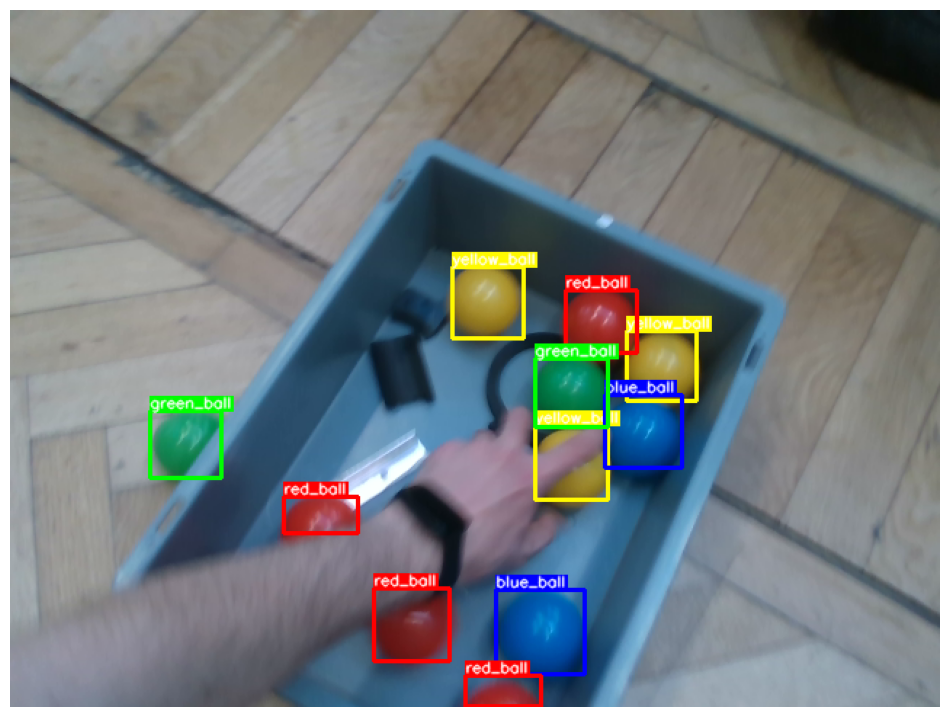

In [54]:
random_sample = random.randrange(0, len(image_paths))

# random sample before augmentation
img_cv2 = cv2.imread(image_paths[random_sample])
img_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
visualize_image(img_cv2, bboxes_xywh[random_sample], classes[random_sample], class_mapping)

Define transformations for bounding boxes augmentation

In [55]:
augmentations = [
    albu.HorizontalFlip(p=0.5), # horizontal flip with probability = 0.5
    albu.VerticalFlip(p=0.5), # vertical flip with probability = 0.5
    albu.RandomSizedBBoxSafeCrop(height=image_height, width=image_width, p=0.75, 
                                 interpolation=cv2.INTER_CUBIC), # crop with full resizing
    albu.RandomBrightnessContrast(p=0.8), # vary brightness with contrast
    albu.CLAHE(clip_limit=1.5, p=0.25), # image equalization
    albu.Blur(blur_limit=15, p=0.8), # image blurring
    albu.GaussNoise(var_limit=(10, 50), p=0.5), # gaussian noise disturbance
    albu.Perspective(keep_size=True, p=0.2), # perspective distortion with 
]

transform = albu.Compose(
    transforms=augmentations,
    bbox_params=albu.BboxParams(format=bbox_format_style, label_fields=["category_ids"])
)

Show the same image with transformation applied

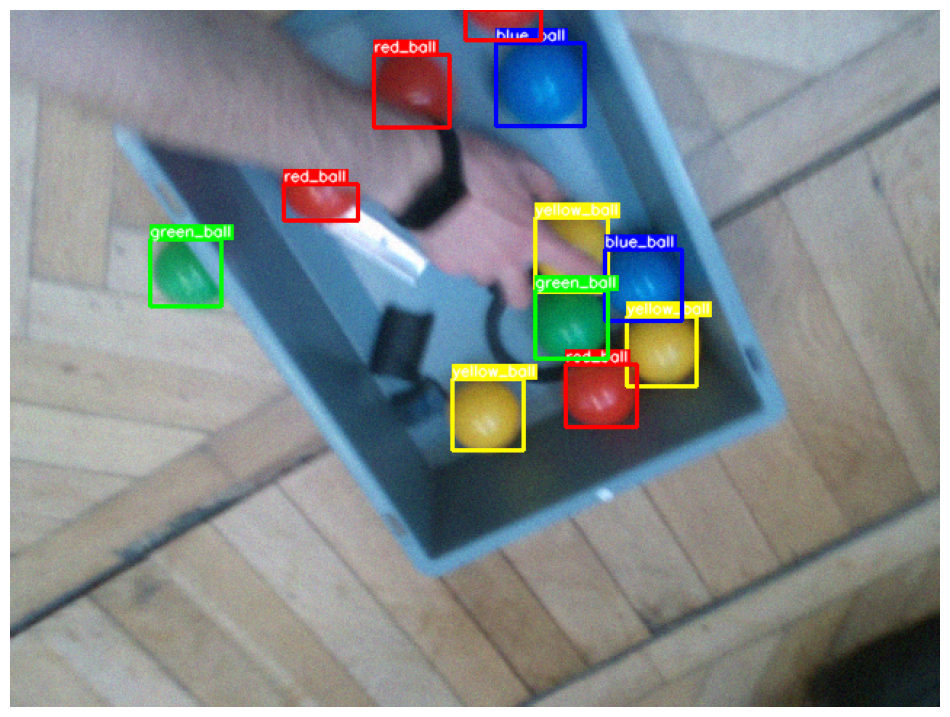

In [56]:
# take a random sample from the dataset
transformed = transform(image=img_cv2, bboxes=bboxes_xywh[random_sample], category_ids=classes[random_sample])
visualize_image(transformed["image"], transformed["bboxes"], transformed["category_ids"], class_mapping)

Create offline augmented dataset and save to disk


In [57]:
# check if the data augmentation was already applied
if os.path.exists(aug_dataset_folder):
    print("Augmented dataset has already been created. Skipping augmentation of the dataset")
else:
    print("Augmented dataset does not exist yet. Creating and saving augmented dataset")

    # create first the augmentation dataset folder
    os.makedirs(aug_dataset_folder, exist_ok=True)
    
    # copy classes text file into new folder
    class_names_file = os.path.join(aug_dataset_folder, 'classes.txt')
    with open(class_names_file, "w") as f:
        for label in class_names:
            f.write(f"{label}\n")
            
    # save transformed dataset to aug_dataset_folder
    image_dir = os.path.join(aug_dataset_folder, 'images')
    label_dir = os.path.join(aug_dataset_folder, 'labels')
    os.makedirs(image_dir, exist_ok=True)
    os.makedirs(label_dir, exist_ok=True)
            
    # new augmented dataset contains the initial dataset plus augmented data
    image_paths_aug = image_paths.copy()
    bboxes_aug = bboxes_xywh.copy()
    classes_aug = classes.copy()
    
    # augment the dataset by AUG_FACTOR times
    AUG_FACTOR = 10
    
    total_iterations = AUG_FACTOR * len(image_paths)
    iteration = 0

    # Create a progress bar with an initial counter value of 0
    pbar = tqdm(total=total_iterations, desc="Creating Augmented Dataset")

    # for each image in the original dataset, create new augmented images and save the paths
    for img_i, img_path in enumerate(image_paths):
        # first read the image from file
        img_cv2 = cv2.imread(img_path)
        #img_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
        for i in range(AUG_FACTOR):
            # random transformations for image augmentation
            transformed_img = transform(image=img_cv2, bboxes=bboxes_xywh[img_i], category_ids=classes[img_i])
            annotations = zip(transformed_img["bboxes"], transformed_img["category_ids"])

            # add the transformed annotations to the augmented dataset
            bboxes_aug.append(transformed_img["bboxes"])
            classes_aug.append(transformed_img["category_ids"])

            # Save the image
            file_number = img_i * AUG_FACTOR + i
            image_path_aug = os.path.join(image_dir, f'aug_data_{file_number}.png')
            cv2.imwrite(image_path_aug, transformed_img["image"])  # save image to file
            image_paths_aug.append(image_path_aug)

            # Save the annotations (text file)
            annotation_path = os.path.join(label_dir, f'aug_data_{file_number}.txt')  # Example
            with open(annotation_path, 'w') as f:
                for box, label in annotations:
                    line = f"{label} {' '.join(str(coord) for coord in box)}\n"  
                    f.write(line)

            iteration = iteration + 1
            pbar.set_description(f"Creating Augmented Dataset: {iteration} / {total_iterations}")
            pbar.update(1)

    pbar.close()
    # save the augmented dataset
    classes = classes_aug
    bboxes_xywh = bboxes_aug
    image_paths = image_paths_aug


Augmented dataset does not exist yet. Creating and saving augmented dataset


Creating Augmented Dataset:   0%|          | 0/920 [00:00<?, ?it/s]

Here we are using `tf.ragged.constant` to create ragged tensors from the `bbox` and
`classes` lists. A ragged tensor is a type of tensor that can handle varying lengths of
data along one or more dimensions. This is useful when dealing with data that has
variable-length sequences, such as text or time series data.

In this case, the `bbox` and `classes` lists have different lengths for each image,
depending on the number of objects in the image and the corresponding bounding boxes and
classes. To handle this variability, ragged tensors are used instead of regular tensors.

Later, these ragged tensors are used to create a `tf.data.Dataset` using the
`from_tensor_slices` method. This method creates a dataset from the input tensors by
slicing them along the first dimension. By using ragged tensors, the dataset can handle
varying lengths of data for each image and provide a flexible input pipeline for further
processing.

In [58]:
classes = tf.ragged.constant(classes)
print("classes ragged shape = ", classes.shape)

bbox = tf.ragged.constant(bboxes_xywh)
print("bbox ragged shape = ", bbox.shape)

image_paths = tf.ragged.constant(image_paths)
print("image paths ragged shape = ", image_paths.shape)

# construct dataset
data = tf.data.Dataset.from_tensor_slices((image_paths, classes, bbox))

classes ragged shape =  (1012, None)
bbox ragged shape =  (1012, None, None)
image paths ragged shape =  (1012,)


Splitting data in training and validation data

In [59]:
TRAIN_SPLIT_RATIO = 0.2

# Determine the number of validation samples
num_val = int(len(image_paths) * TRAIN_SPLIT_RATIO)

print("validation set size: ", num_val)
print("train set size: ", len(image_paths) - num_val)

# Split the dataset into train and validation sets
val_data = data.take(num_val)
train_data = data.skip(num_val)

validation set size:  202
train set size:  810


Bounding boxes in KerasCV have a predetermined format. To do this, we bundle the bounding
boxes into a dictionary that complies with the requirements listed below:

```python
bounding_boxes = {
    # num_boxes may be a Ragged dimension
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```

The dictionary has two keys, `'boxes'` and `'classes'`, each of which maps to a
TensorFlow RaggedTensor or Tensor object. The `'boxes'` Tensor has a shape of `[batch,
num_boxes, 4]`, where batch is the number of images in the batch and num_boxes is the
maximum number of bounding boxes in any image. The 4 represents the four values needed to
define a bounding box:  xmin, ymin, xmax, ymax.

The `'classes'` Tensor has a shape of `[batch, num_boxes]`, where each element represents
the class label for the corresponding bounding box in the `'boxes'` Tensor. The num_boxes
dimension may be ragged, which means that the number of boxes may vary across images in
the batch.

Final dict should be:
```python
{"images": images, "bounding_boxes": bounding_boxes}
```

Convert bounding boxes types into absolute values. YOLO format is center (relative values) x,y, width, height. The target must be absolute x,y (top left corner), width, height.


In [60]:

def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    return image


def load_dataset(image_path, classes, bbox):
    # Read Image
    image = load_image(image_path)
    
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.int32),
        "boxes": tf.cast(bbox, dtype=tf.float32)
    }
    return {"images": tf.cast(image, tf.int32), "bounding_boxes": bounding_boxes}


## Online Data Augmentation

One of the most challenging tasks when constructing object detection pipelines is data
augmentation. It involves applying various transformations to the input images to
increase the diversity of the training data and improve the model's ability to
generalize. However, when working with object detection tasks, it becomes even more
complex as these transformations need to be aware of the underlying bounding boxes and
update them accordingly.

KerasCV provides native support for bounding box augmentation. KerasCV offers an
extensive collection of data augmentation layers specifically designed to handle bounding
boxes. These layers intelligently adjust the bounding box coordinates as the image is
transformed, ensuring that the bounding boxes remain accurate and aligned with the
augmented images.

By leveraging KerasCV's capabilities, developers can conveniently integrate bounding
box-friendly data augmentation into their object detection pipelines. By performing
on-the-fly augmentation within a tf.data pipeline, the process becomes seamless and
efficient, enabling better training and more accurate object detection results.

In [61]:
aug_resizing = keras_cv.layers.JitteredResize(target_size=(image_height, image_width), 
                                              scale_factor=(1.0, 1.0),
                                              bounding_box_format=bbox_format_type, 
                                              interpolation="bicubic")

# random saturation, brightness
aug_saturation = keras_cv.layers.RandomSaturation(factor=(0.3, 0.7))
aug_sharpness = keras_cv.layers.RandomSharpness(factor=(0.3, 0.7), value_range=(0,255))


augmenter = keras.Sequential(
    layers=[
        aug_saturation,
        aug_sharpness,
        aug_resizing,
        #aug_random_shear
    ]
)


## Hyperparameters


In [62]:
BATCH_SIZE = 8

## Create Training and Validation Datasets


In [63]:
train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)

In [64]:
# no image augmentation on validation dataset
val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.shuffle(BATCH_SIZE * 4)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.map(aug_resizing, num_parallel_calls=tf.data.AUTOTUNE)

### Visualization of some training samples with their bounding boxes

In [65]:
"""
def visualize_dataset(inputs):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        rows=4,
        cols=2,
        line_thickness=1,
        text_thickness=2,
        y_true=bounding_boxes, # only show true labels
        scale=5,
        font_scale=0.5,
        bounding_box_format=bbox_format_type,
        class_mapping=class_mapping,
    )
"""

def visualize_dataset(data_set):
    samples = next(iter(data_set.take(1)))
    batch_imgs = samples["images"]
    batch_bboxes = samples["bounding_boxes"]["boxes"]
    batch_classes = samples["bounding_boxes"]["classes"]
    visualize_batch(batch_imgs, batch_bboxes, batch_classes, class_mapping)
    

Visualize some training samples with their bounding boxes to ensure that the data 
preprocessing is correct.

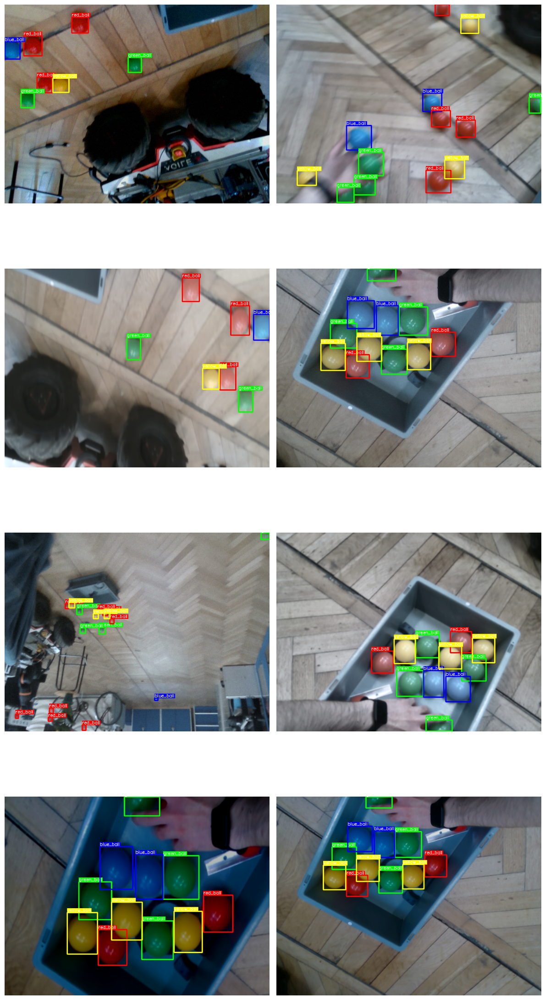

In [66]:
visualize_dataset(train_ds)

Visualize some validation samples with their bounding boxes to ensure that the data

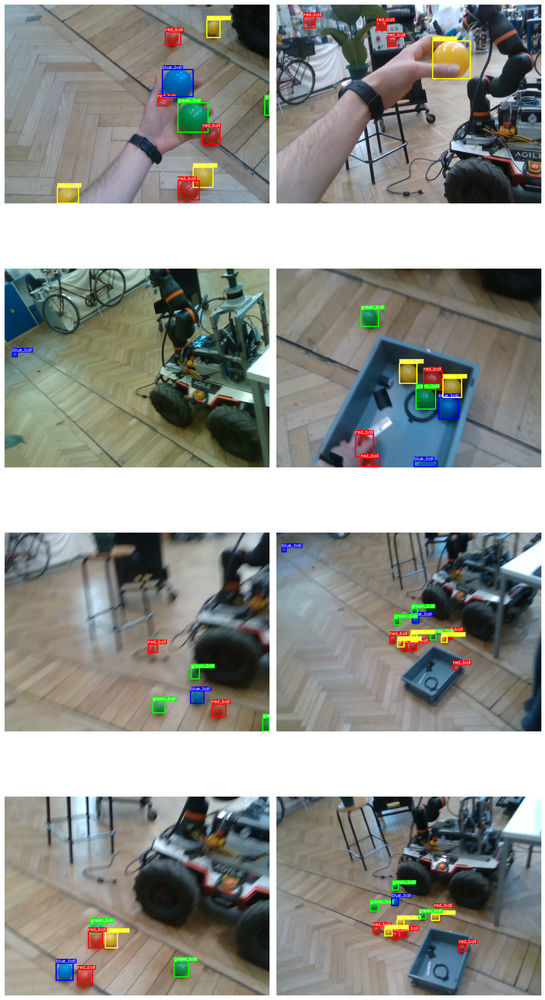

In [67]:
visualize_dataset(val_ds)

We need to extract the inputs from the preprocessing dictionary and get them ready to be
fed into the model.

In [68]:
def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )

train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

## Creating Model

YOLOv8 is a cutting-edge YOLO model that is used for a variety of computer vision tasks,
such as object detection, image classification, and instance segmentation. Ultralytics,
the creators of YOLOv5, also developed YOLOv8, which incorporates many improvements and
changes in architecture and developer experience compared to its predecessor. YOLOv8 is
the latest state-of-the-art model that is highly regarded in the industry.

Below table compares the performance metrics of five different YOLOv8 models with
different sizes (measured in pixels): YOLOv8n, YOLOv8s, YOLOv8m, YOLOv8l, and YOLOv8x.
The metrics include mean average precision (mAP) values at different
intersection-over-union (IoU) thresholds for validation data, inference speed on CPU with
ONNX format and A100 TensorRT, number of parameters, and number of floating-point
operations (FLOPs) (both in millions and billions, respectively). As the size of the
model increases, the mAP, parameters, and FLOPs generally increase while the speed
decreases. YOLOv8x has the highest mAP, parameters, and FLOPs but also the slowest
inference speed, while YOLOv8n has the smallest size, fastest inference speed, and lowest
mAP, parameters, and FLOPs.

#### YOLOv8 Model Comparison

This table compares the different versions of the YOLOv8 object detection model, highlighting their key differences.

| Feature                | YOLOv8s | YOLOv8m | YOLOv8l | YOLOv8x |
|-------------------------|---|---|---|---|---|
| Parameters (Millions)   | 6.9     | 13.7    | 31.9    | 58.9    |
| FLOPs (Billions)        | 16.1    | 32.2    | 75.1    | 138.5   |
| AP (COCO mAP @ 0.5)      | 41.6    | 46.0    | 48.4    | 50.3    |
| Input Size (Width x Height) | 416x416 | 480x480 | 640x640 | 896x896 |

**Explanation:**

* **Parameters:** The number of trainable parameters in the model. Higher parameter count generally leads to better accuracy but also requires more computational resources.
* **FLOPs:** Floating-point Operations Per Second. This metric indicates the computational complexity of the model. Lower FLOPs allow for faster inference on devices with limited resources.
* **AP (COCO mAP @ 0.5):** Average Precision on the COCO dataset, measured using Mean Average Precision (mAP) at an Intersection over Union (IoU) threshold of 0.5. Higher mAP indicates better detection performance.
* **Input Size:** The image resolution that the model is designed for. Larger input sizes can improve accuracy but also increase processing time.

**Choosing the right YOLOv8 version depends on your specific needs:**

* If you prioritize speed and have limited computational resources, consider YOLOv8s.
* If you require a balance between speed and accuracy, YOLOv8m is a good option.
* For the highest accuracy, but with increased computational demands, choose YOLOv8l or YOLOv8x.


First we will create a instance of backbone which will be used by our yolov8 detector
class.

YOLOV8 Backbones available in KerasCV:

-   Without Weights:

    1.   yolo_v8_xs_backbone
    2.   yolo_v8_s_backbone
    3.   yolo_v8_m_backbone
    4.   yolo_v8_l_backbone
    5.   yolo_v8_xl_backbone

- With Pre-trained coco weight:

    1.   yolo_v8_xs_backbone_coco
    2.   yolo_v8_s_backbone_coco
    2.   yolo_v8_m_backbone_coco
    2.   yolo_v8_l_backbone_coco
    2.   yolo_v8_xl_backbone_coco



In [69]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_s_backbone",  # We will use yolov8 small backbone with coco weights
)

Attaching 'config.json' from model 'keras/yolov8/keras/yolo_v8_s_backbone/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/yolov8/keras/yolo_v8_s_backbone/2' to your Kaggle notebook...


Next, let's build a YOLOV8 model using the `YOLOV8Detector`, which accepts a feature
extractor as the `backbone` argument, a `num_classes` argument that specifies the number
of object classes to detect based on the size of the `class_mapping` list, a
`bounding_box_format` argument that informs the model of the format of the bbox in the
dataset, and a finally, the feature pyramid network (FPN) depth is specified by the
`fpn_depth` argument.

It is simple to build a YOLOV8 using any of the aforementioned backbones thanks to
KerasCV.

In [70]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format=bbox_format_type,
    from_logits=True,
    iou_threshold=0.2, # Decrease the required threshold to make predictions get pruned out
    confidence_threshold=0.6, # Tune confidence threshold for predictions to pass NMS
)

yolo = keras_cv.models.YOLOV8Detector(
    num_classes=len(class_mapping),
    bounding_box_format=bbox_format_type,
    backbone=backbone,
    fpn_depth=3,
    prediction_decoder=prediction_decoder
)

#for i in range(len(yolo.weights)):
#    yolo.weights[i]._handle_name = yolo.weights[i].name + "_" + str(i)

yolo.summary()

Model: "yolov8_detector_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ [(None, None,     │  5,089,760 │ input_layer_3[0]… │
│ (Functional)        │ None, 128),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 256),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 512)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_4 (Repeat)   │ (None, None,      │          0 │ functional_3[0][… │
│                     │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_5 (Repeat)   │ (None, None,      │          0 │ repeat_4[0][0]    │
│                     │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_22      │ (None, None,      │          0 │ repeat_5[0][0],   │
│ (Concatenate)       │ None, 768)        │            │ functional_3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_co… │ (None, None,      │    196,608 │ concatenate_22[0… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_bn  │ (None, None,      │      1,024 │ pa_fpn_p4p5_pre_… │
│ (BatchNormalizatio… │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre     │ (None, None,      │          0 │ pa_fpn_p4p5_pre_… │
│ (Activation)        │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ split_12 (Split)    │ [(None, None,     │          0 │ pa_fpn_p4p5_pre[… │
│                     │ None, 128),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 128)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │          0 │ split_12[0][1]    │
│ (ZeroPadding2D)     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │    147,456 │ pa_fpn_p4p5_pre_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │        512 │ pa_fpn_p4p5_pre_… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_1 │ (None, None,      │          0 │ pa_fpn_p4p5_pre_… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │          0 │ pa_fpn_p4p5_pre_… │
│ (ZeroPadding2D)     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │    147,456 │ pa_fpn_p4p5_pre_

 Total params: 13,620,908 (51.96 MB)

 Trainable params: 13,597,804 (51.87 MB)

 Non-trainable params: 23,104 (90.25 KB)

## Compile the Model

Loss used for YOLOV8


1. Classification Loss: This loss function calculates the discrepancy between anticipated
class probabilities and actual class probabilities. In this instance,
`binary_crossentropy`, a prominent solution for binary classification issues, is
Utilized. We Utilized binary crossentropy since each thing that is identified is either
classed as belonging to or not belonging to a certain object class (such as a person, a
car, etc.).

2. Box Loss: `box_loss` is the loss function used to measure the difference between the
predicted bounding boxes and the ground truth. In this case, the Complete IoU (CIoU)
metric is used, which not only measures the overlap between predicted and ground truth
bounding boxes but also considers the difference in aspect ratio, center distance, and
box size. Together, these loss functions help optimize the model for object detection by
minimizing the difference between the predicted and ground truth class probabilities and
bounding boxes.


In [71]:
EPOCHS = 100
GLOBAL_CLIPNORM = 10.0

initial_learning_rate = 0.002
decay_steps = 250
decay_rate = 0.9

# exponential decay for learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=decay_steps,
    decay_rate=decay_rate,
    staircase=True  # Option for discrete stair-like decay
)

# Create an optimizer with the desired learning rate schedule
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule,
                                     global_clipnorm=GLOBAL_CLIPNORM)

yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", 
    box_loss="ciou"
)

## COCO Metric Callback

We will be using `BoxCOCOMetrics` from KerasCV to evaluate the model and calculate the
Map(Mean Average Precision) score, Recall and Precision. We also save our model when the
mAP score improves.

In [72]:
checkpoint_folder_path = "/kaggle/working/checkpoints/yolov8s/"

class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format=bbox_format_type,
            evaluate_freq=1e9,
        )
        self.best_map = -1.0

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        # compute the metrics for each batch in the dataset
        for batch in self.data:
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            self.metrics.update_state(y_true, y_pred)
        metrics = self.metrics.result(force=True)
        
         # Filter metrics for printing important values only 
        filtered_metrics = {name: value for name, value in metrics.items() if
                            name in ("loss", "val_loss", "MaP", "MaP@[IoU=50]", "MaP@[IoU=75]")}
        
        # Explicitly add learning rate  (accessed via the optimizer)
        filtered_metrics['learning_rate'] = float(tf.keras.backend.get_value(self.model.optimizer.learning_rate))
        
        # log only the filtered metrics
        logs.update(filtered_metrics) 

        current_map = metrics["MaP"]
        if current_map > self.best_map:
            self.best_map = current_map
            self.model.save(checkpoint_folder_path + f"ck_best.keras")  # Save the model when mAP improves

        return logs
    

# this callback displays more verbose metrics info about precision and recall
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    validation_data=val_ds, bounding_box_format=bbox_format_type
)

# separated callback that saves best model checkpoint on epoch end
checkpoint_callback = ModelCheckpoint(
    filepath= checkpoint_folder_path + "ck_best.keras",
    monitor="val_mAP",  # Monitor the validation mAP
    mode="max",         # Save the model with the highest mAP
    save_best_only=True,
    save_weights_only=False  # Save the entire model
)

# early stopping callback
early_stopping_callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                        verbose=1)


## Train the Model

In [73]:
yolo.fit(
    x=train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[EvaluateCOCOMetricsCallback(val_ds), early_stopping_callback],
    #callbacks=[checkpoint_callback, coco_metrics_callback, early_stopping_callback]
)

Epoch 1/200
101/101 ━━━━━━━━━━━━━━━━━━━━ 141s 658ms/step - loss: 5810.9746 - val_loss: 19.0618 - MaP: 5.8003e-05 - MaP@[IoU=50]: 3.4654e-04 - MaP@[IoU=75]: 0.0000e+00 - learning_rate: 0.0020
Epoch 2/200
101/101 ━━━━━━━━━━━━━━━━━━━━ 47s 452ms/step - loss: 5.4652 - val_loss: 5.1204 - MaP: 1.2687e-05 - MaP@[IoU=50]: 7.0737e-05 - MaP@[IoU=75]: 2.0642e-06 - learning_rate: 0.0020
Epoch 3/200
101/101 ━━━━━━━━━━━━━━━━━━━━ 80s 434ms/step - loss: 4.9490 - val_loss: 5.0584 - MaP: 4.5907e-05 - MaP@[IoU=50]: 2.9270e-04 - MaP@[IoU=75]: 7.3646e-07 - learning_rate: 0.0020
Epoch 4/200
101/101 ━━━━━━━━━━━━━━━━━━━━ 47s 450ms/step - loss: 4.9956 - val_loss: 4.6686 - MaP: 9.5585e-04 - MaP@[IoU=50]: 0.0068 - MaP@[IoU=75]: 3.7830e-05 - learning_rate: 0.0020
Epoch 5/200
101/101 ━━━━━━━━━━━━━━━━━━━━ 47s 449ms/step - loss: 4.8566 - val_loss: 4.8701 - MaP: 3.2773e-04 - MaP@[IoU=50]: 0.0021 - MaP@[IoU=75]: 1.4311e-05 - learning_rate: 0.0020
Epoch 6/200
101/101 ━━━━━━━━━━━━━━━━━━━━ 46s 442ms/step - loss: 4.7861 - 

## Visualize Predictions

In [74]:
"""
def visualize_detections(model, dataset):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bbox_format_type,
        y_true=y_true,
        y_pred=y_pred,
        scale=5,
        rows=4,
        cols=2,
        show=True,
        font_scale=0.5,
        class_mapping=class_mapping,
    )
"""

def visualize_batch_pred(images, bboxes, category_ids, category_id_to_name):
    """Visualizes a batch of images with bounding boxes in a single plot."""
    batch_size = len(images.numpy())
    num_rows = batch_size // 2  # Calculate rows for 2 columns
    num_cols = 2

    # Create the figure and subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 6 * num_rows)) 
    axes = axes.flatten()  # Flatten for easier iteration if needed

    for i, ax in enumerate(axes):  
        if i < batch_size:  # Handle cases where batch_size isn't perfectly divisible by 2
            image = images[i].numpy().astype(np.int32).copy()
            for bbox, category_id in zip(bboxes[i], category_ids[i]):
                class_name = category_id_to_name[category_id]
                image = visualize_bbox(image, bbox, class_name, 
                                       color=COLOR_MAPPING[category_id],
                                      format=bbox_format_style)
            ax.imshow(image)
            ax.axis('off')
        else:
            ax.axis('off')  # Hide unused axes

    plt.tight_layout()  # Improve spacing
    plt.show()


def visualize_detections(model, data_set):
    # predict on the batch of samples
    samples_imgs, samples_true = next(iter(data_set.take(1)))
    samples_predictions = model.predict(samples_imgs)
    print(samples_predictions)
    
    # visualize batch of predictions
    batch_imgs = samples_imgs
    batch_bboxes = samples_predictions["boxes"]
    batch_classes = samples_predictions["classes"]
    visualize_batch_pred(batch_imgs, batch_bboxes, batch_classes, class_mapping)
    

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


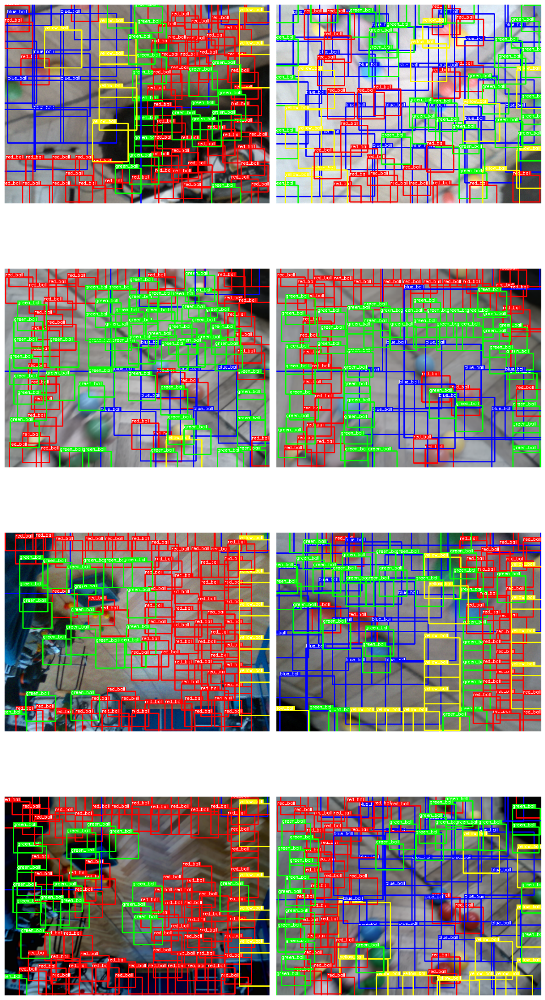

In [75]:
# visualize predictions on training dataset
visualize_detections(yolo, data_set=train_ds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


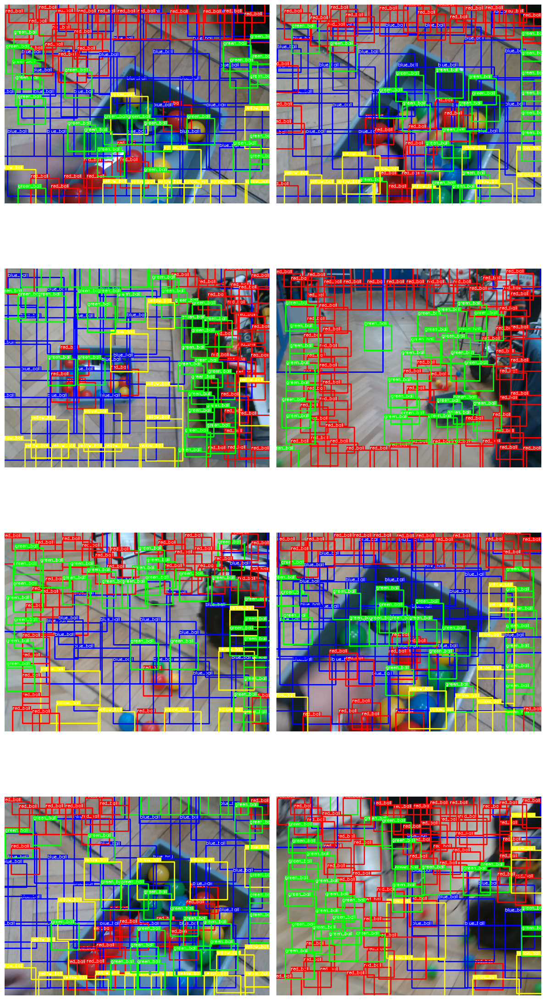

In [76]:
# visualize predictions on validation dataset
visualize_detections(yolo, data_set=val_ds)